<div align="center"><h1>Workforce Analysis - Churn</h1>
    <h3>By: Wiebke Plückhahn, 01/05/2023</h3></div>

In this fictious case study, a midsize company is interested in their staff. Most recently, the company observed some **brain drain** to competitors. The aim of this project is therefore to conduct a **churn analysis** to examine which employees are most likely to leave the company. At the same time, reasons should be determined that could persuade the churn candidates to stay. A **factor analysis** followed by **logistic regression, KNN, and random forest** models will be implemented and compared.

The dataset these analyses are performed with is the IBM HR Analytics dataset (available at https://www.kaggle.com/datasets/pavansubhasht/ibm-hr-analytics-attrition-dataset).

In [ ]:
#Setting up the environment
!pip install factor_analyzer  
!pip install pingouin
!pip install imblearn
!pip install yellowbrick
!pip install pandas_gbq
from yellowbrick.model_selection import RFECV
import pingouin as pg
from factor_analyzer import FactorAnalyzer
from factor_analyzer.factor_analyzer import calculate_kmo
from imblearn.over_sampling import SMOTE
import math
from google.cloud.bigquery import Client, QueryJobConfig
import pandas_gbq
import numpy as np
import pandas as pd
from sklearn import preprocessing
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn import neighbors
from sklearn.metrics import mean_absolute_error, mean_squared_error
import statsmodels.api as sm
import warnings
warnings.filterwarnings("ignore")
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings(action='ignore', category=DataConversionWarning)
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="white")
%matplotlib inline
pd.set_option('display.max_columns', 60)

In [2]:
#importing data from BigQuery
#Note: This Notebook was originally hosted on Google Cloud Vertex AI Workbench
client = Client()
query = """SELECT * FROM `superstore-367609.churn.churn`"""
job = client.query(query)
df = job.to_dataframe()
df.info()
df.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1470 non-null   Int64  
 1   Attrition                 1470 non-null   boolean
 2   BusinessTravel            1470 non-null   object 
 3   DailyRate                 1470 non-null   Int64  
 4   Department                1470 non-null   object 
 5   DistanceFromHome          1470 non-null   Int64  
 6   Education                 1470 non-null   Int64  
 7   EducationField            1470 non-null   object 
 8   EmployeeCount             1470 non-null   Int64  
 9   EmployeeNumber            1470 non-null   Int64  
 10  EnvironmentSatisfaction   1470 non-null   Int64  
 11  Gender                    1470 non-null   object 
 12  HourlyRate                1470 non-null   Int64  
 13  JobInvolvement            1470 non-null   Int64  
 14  JobLevel

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,48,False,Travel_Rarely,530,Sales,29,1,Medical,1,473,1,Female,91,3,3,Manager,3,Married,12504,23978,3,True,False,21,4,2,80,1,15,3,1,0,0,0,0
1,45,False,Travel_Frequently,364,Research & Development,25,3,Medical,1,1306,2,Female,83,3,5,Manager,2,Single,18061,13035,3,True,False,22,4,3,80,0,22,4,3,0,0,0,0


<h2>Sanity checks and exploratory analysis</h2>

In [3]:
#explore missing values
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

No mssing values need to be replaced.

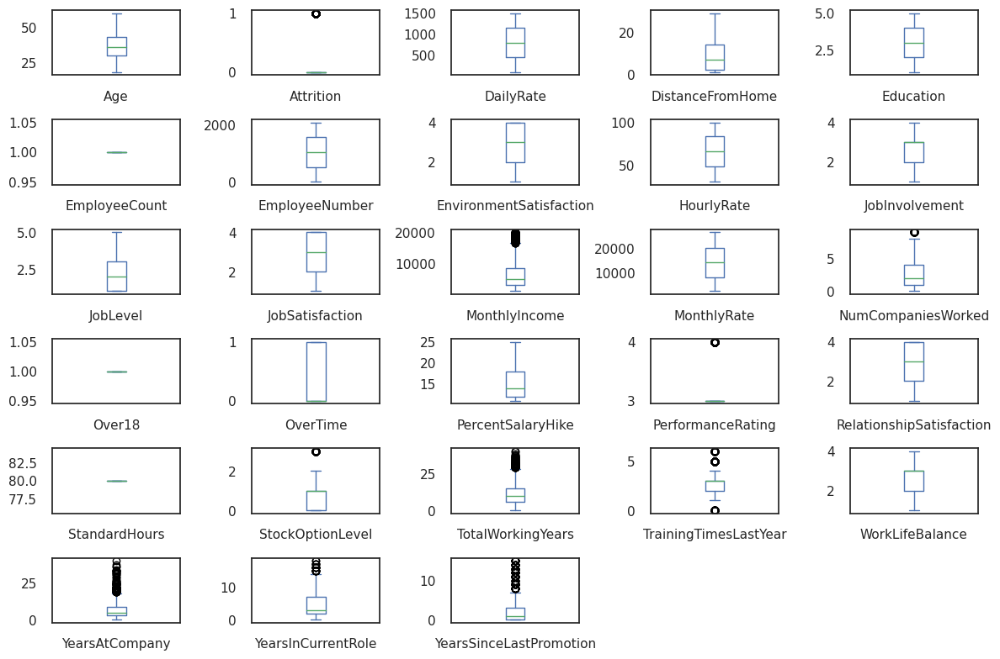

In [4]:
#explore outliers
df_int = df.select_dtypes(include=np.number)

cols=len(df_int.columns)
fig_row=math.ceil(cols/5)
fig_row
fig=plt.figure()
fig.set_size_inches(12,8)

for i in range(1, cols):
    ax=fig.add_subplot(fig_row, 5, i)
    df_int.iloc[:,i-1].plot.box(ax=ax)
fig.tight_layout()
plt.show()

Nine variables show outliers, namely the monthly income, number of companies worked at, performance rating, stock option level, total working years, training times last year, years at company, in current role, and since last promotion.
As some of the algorithms used below are quite sensitive to outliers, values larger and smaller than 2 standard deviations +- variable mean will be replaced by mean imputation. However, the performancd rating will not be replaced as 4 is the upper limit of the scale (and thus a plausible value) and variance will be non existant when 4 is replaced by the mean.

In [5]:
m=int(df['MonthlyIncome'].mean())
std=int(df['MonthlyIncome'].std())
df['MonthlyIncome'].mask(df['MonthlyIncome'] > (m+2*std), m, inplace=True)

m=int(df['NumCompaniesWorked'].mean())
std=int(df['NumCompaniesWorked'].std())
df['NumCompaniesWorked'].mask(df['NumCompaniesWorked'] > (m+2*std), m, inplace=True)

m=int(df['StockOptionLevel'].mean())
std=int(df['StockOptionLevel'].std())
df['StockOptionLevel'].mask(df['StockOptionLevel'] > (m+2*std), m, inplace=True)

m=int(df['TotalWorkingYears'].mean())
std=int(df['TotalWorkingYears'].std())
df['TotalWorkingYears'].mask(df['TotalWorkingYears'] > (m+2*std), m, inplace=True)

m=int(df['TrainingTimesLastYear'].mean())
std=int(df['TrainingTimesLastYear'].std())
df['TrainingTimesLastYear'].mask(df['TrainingTimesLastYear'] > (m+2*std), m, inplace=True)
df['TrainingTimesLastYear'].mask(df['TrainingTimesLastYear'] < (m-2*std), m, inplace=True)

m=int(df['YearsAtCompany'].mean())
std=int(df['YearsAtCompany'].std())
df['YearsAtCompany'].mask(df['YearsAtCompany'] > (m+2*std), m, inplace=True)

m=int(df['YearsInCurrentRole'].mean())
std=int(df['YearsInCurrentRole'].std())
df['YearsInCurrentRole'].mask(df['YearsInCurrentRole'] > (m+2*std), m, inplace=True)

m=int(df['YearsSinceLastPromotion'].mean())
std=int(df['YearsSinceLastPromotion'].std())
df['YearsSinceLastPromotion'].mask(df['YearsSinceLastPromotion'] > (m+2*std), m, inplace=True)

Next, string variables will be explored.

In [6]:
df_obj=df.select_dtypes(include=[object,bool])
df_obj

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
0,False,Travel_Rarely,Sales,Medical,Female,Manager,Married,True,False
1,False,Travel_Frequently,Research & Development,Medical,Female,Manager,Single,True,False
2,False,Travel_Rarely,Sales,Life Sciences,Female,Manager,Single,True,True
3,False,Travel_Rarely,Sales,Marketing,Male,Manager,Divorced,True,False
4,False,Travel_Rarely,Sales,Marketing,Male,Manager,Married,True,False
...,...,...,...,...,...,...,...,...,...
1465,False,Travel_Frequently,Research & Development,Life Sciences,Male,Healthcare Representative,Married,True,False
1466,False,Non-Travel,Research & Development,Life Sciences,Male,Healthcare Representative,Married,True,False
1467,False,Travel_Frequently,Research & Development,Medical,Male,Healthcare Representative,Married,True,True
1468,False,Non-Travel,Research & Development,Medical,Male,Healthcare Representative,Divorced,True,True


All variables will be wrangled for further analyses. Attrition, Gender, and OverTime will be coded in 0/1, so will be MaritalStatus (0 = single or divorced, 1 = married). Over18 will be exluded as Age already holds this information.
BusinessTravel will be considered ordinary with values from 0 (non-travel) to 2 (frequent travel). 
Department, EducationField, and JobRole will be dummy coded.

In [7]:
#recoding variables
df.Attrition=df.Attrition.replace({True:1, False:0})
df.Gender=df.Gender.replace({'Female':1, 'Male':0})
df.OverTime=df.OverTime.replace({True:1, False:0})
df.MaritalStatus=df.MaritalStatus.replace({'Married':1, 'Single':0, 'Divorced':0})
df.BusinessTravel=df.BusinessTravel.replace({'Non-Travel':0, 'Travel_Rarely':1, 'Travel_Frequently':2})

#renaming and dropping irrelevant columns
df.rename(columns={'Gender':'Female', 'MaritalStatus':'Married'}, inplace=True)
df.drop(columns=['Over18'], inplace=True)

#storing a copy of the full dataframe and dummy coding
df_full=df
df = pd.get_dummies(df,columns=['Department', 'EducationField', 'JobRole'])

display(df_full.describe(include='all'))

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Female,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,Married,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470,1470.000000,1470.000000,1470,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
unique,NaN,NaN,NaN,NaN,3,NaN,NaN,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,Research & Development,NaN,NaN,Life Sciences,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Sales Executive,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,961,NaN,NaN,606,NaN,NaN,NaN,NaN,NaN,NaN,NaN,326,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,36.923810,0.161224,1.086395,802.485714,NaN,9.192517,2.912925,NaN,1.0,1024.865306,2.721769,0.400000,65.891156,2.729932,2.063946,NaN,2.728571,0.457823,5487.664626,14313.103401,1.993878,0.282993,15.209524,3.153741,2.712245,80.0,0.0,9.972109,2.379592,2.761224,5.929252,3.738095,1.595918,4.123129
std,9.135373,0.367863,0.532170,403.509100,NaN,8.106864,1.024165,NaN,0.0,602.024335,1.093082,0.490065,20.329428,0.711561,1.106940,NaN,1.102846,0.498387,3026.069274,7117.786044,1.589393,0.450606,3.659938,0.360824,1.081209,0.0,0.0,5.748641,0.848732,0.706476,4.050787,2.889403,2.054727,3.568136
min,18.000000,0.000000,0.000000,102.000000,NaN,1.000000,1.000000,NaN,1.0,1.000000,1.000000,0.000000,30.000000,1.000000,1.000000,NaN,1.000000,0.000000,1009.000000,2094.000000,0.000000,0.000000,11.000000,3.000000,1.000000,80.0,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,0.000000,1.000000,465.000000,NaN,2.000000,2.000000,NaN,1.0,491.250000,2.000000,0.000000,48.000000,2.000000,1.000000,NaN,2.000000,0.000000,2911.000000,8047.000000,1.000000,0.000000,12.000000,3.000000,2.000000,80.0,0.0,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,0.000000,1.000000,802.000000,NaN,7.000000,3.000000,NaN,1.0,1020.500000,3.000000,0.000000,66.000000,3.000000,2.000000,NaN,3.000000,0.000000,4919.000000,14235.500000,2.000000,0.000000,14.000000,3.000000,3.000000,80.0,0.0,10.000000,2.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,0.000000,1.000000,1157.000000,NaN,14.000000,4.000000,NaN,1.0,1555.750000,4.000000,1.000000,83.750000,3.000000,3.000000,NaN,4.000000,1.000000,6502.000000,20461.500000,3.000000,1.000000,18.000000,3.000000,4.000000,80.0,0.0,12.000000,3.000000,3.000000,8.000000,7.000000,2.000000,7.000000


StandardHours will be excluded from the dataframe for further analyses, as it is 80 for all employees and does not hold any further information. Same applies for EmployeeCount and Number.
Also, distributions of the relationships and all variables in the data will be assessed next.

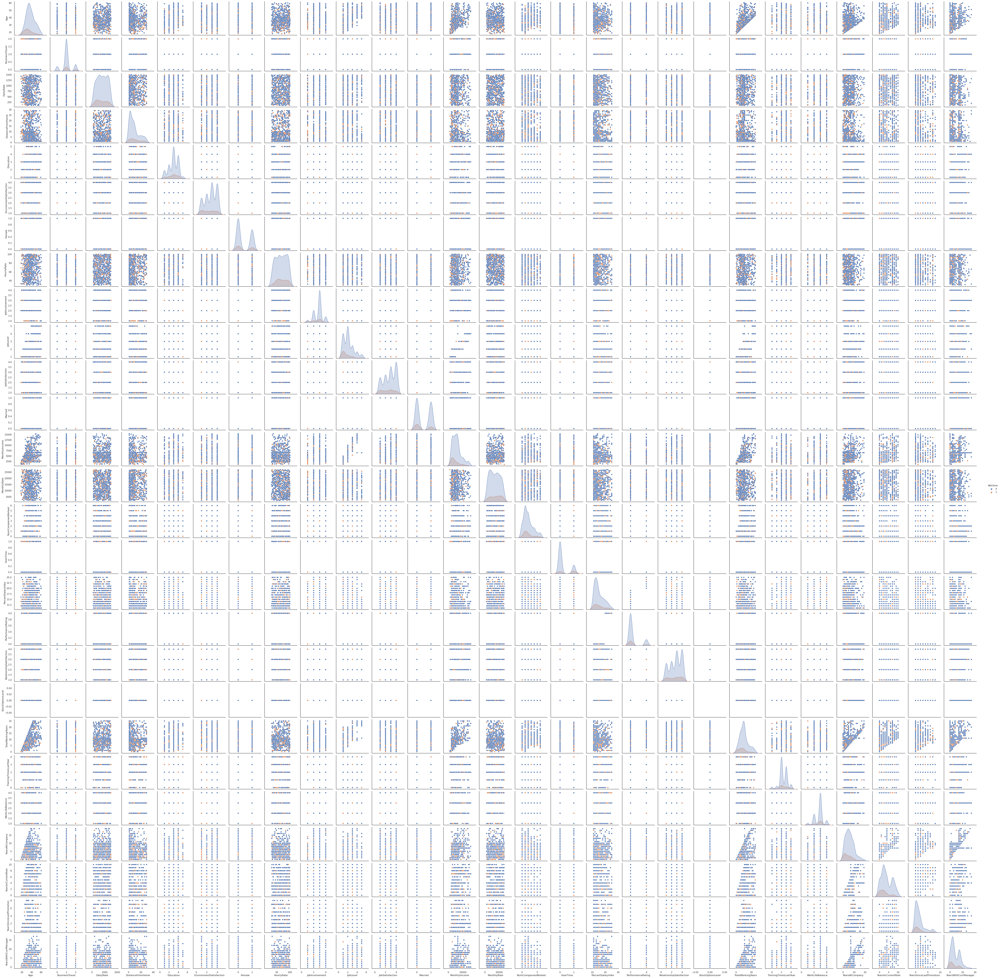

In [8]:
df.rename(columns={'Department_Human Resources' : 'Department_Human_Resources',
'Department_Research & Development' : 'Department_Research_Development',
'EducationField_Human Resources' : 'EducationField_Human_Resources',
'EducationField_Life Sciences' : 'EducationField_Life_Sciences',
'EducationField_Technical Degree' : 'EducationField_Technical_Degree',
'JobRole_Healthcare Representative' : 'JobRole_Healthcare_Representative',
'JobRole_Human Resources' : 'JobRole_Human_Resources',       
'JobRole_Laboratory Technician' : 'JobRole_Laboratory_Technician',            
'JobRole_Manufacturing Director' : 'JobRole_Manufacturing_Director',
'JobRole_Research Director' : 'JobRole_Research_Director',
'JobRole_Research Scientist' : 'JobRole_Research_Scientist',
'JobRole_Sales Executive' : 'JobRole_Sales_Executive',
'JobRole_Sales Representative': 'JobRole_Sales_Representative'}, inplace=True)
df=df.astype('int')
df.drop(columns=['EmployeeCount', 'EmployeeNumber', 'StandardHours'], inplace=True)

#This df will be the foundation of all further analyses, therefore a copy will be stored in BigQuery
#pandas_gbq.to_gbq(df, 'churn.formatted', project_id='superstore-367609')

#Generate random subsample of 750 employees for pairplot to optimize runtime
df_pairplot = df.iloc[:, :28].sample(n = 750)
sns.pairplot(df_pairplot, hue='Attrition', diag_kind='kde')

Serveral variables are not normally distributed. This might be a problem for the logistic regression model set up below (though regression models assume normal distribution of residuals, not of variables) but it should be kept in mind when comparing the different machine learning models.

,Age,Attrition,BusinessTravel,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Female,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,Married,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Department_Human_Resources,Department_Research_Development,Department_Sales,EducationField_Human_Resources,EducationField_Life_Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical_Degree,JobRole_Healthcare_Representative,JobRole_Human_Resources,JobRole_Laboratory_Technician,JobRole_Manager,JobRole_Manufacturing_Director,JobRole_Research_Director,JobRole_Research_Scientist,JobRole_Sales_Executive,JobRole_Sales_Representative
Age,1.00,-0.17,-0.02,0.01,-0.02,0.20,0.01,0.04,0.03,0.03,0.49,-0.01,0.08,0.42,0.02,0.36,0.03,0.01,0.00,0.05,NaN,0.60,0.05,-0.00,0.19,0.16,0.14,0.19,0.02,0.02,-0.03,0.00,0.02,0.04,-0.01,-0.03,-0.04,0.11,-0.03,-0.14,0.28,0.05,0.18,-0.15,-0.00,-0.17
Attrition,-0.17,1.00,0.13,-0.06,0.08,-0.03,-0.10,-0.03,-0.01,-0.12,-0.19,-0.10,-0.09,-0.18,0.02,0.01,0.25,-0.02,0.00,-0.04,NaN,-0.19,-0.01,-0.05,-0.19,-0.17,-0.05,-0.18,0.02,-0.09,0.08,0.04,-0.03,0.06,-0.05,-0.02,0.07,-0.08,0.04,0.10,-0.08,-0.08,-0.09,-0.00,0.02,0.16
BusinessTravel,-0.02,0.13,1.00,-0.02,-0.02,-0.01,-0.01,0.04,-0.01,0.03,-0.02,0.01,-0.00,-0.00,-0.01,-0.01,0.04,-0.04,0.00,0.01,NaN,0.01,0.04,0.00,0.00,0.01,0.02,0.00,-0.00,0.01,-0.00,-0.00,0.02,0.00,-0.01,-0.00,-0.02,-0.00,0.01,0.00,-0.04,0.01,-0.01,0.00,-0.02,0.06
DailyRate,0.01,-0.06,-0.02,1.00,-0.00,-0.01,0.02,0.01,0.02,0.04,0.00,0.03,0.04,0.02,-0.03,0.02,0.01,0.03,0.00,0.01,NaN,0.02,-0.03,-0.04,-0.00,-0.00,-0.03,-0.00,-0.03,0.01,-0.00,-0.04,0.00,-0.06,0.03,-0.00,0.03,0.04,-0.02,-0.01,-0.01,-0.01,0.00,-0.00,-0.00,0.01
DistanceFromHome,-0.02,0.08,-0.02,-0.00,1.00,0.02,-0.01,-0.00,0.02,0.03,0.02,-0.01,0.02,0.02,0.04,-0.00,0.04,0.03,0.01,0.01,NaN,0.01,-0.02,-0.02,0.02,0.02,-0.00,0.00,-0.02,-0.02,0.03,-0.00,-0.04,0.05,0.02,0.01,-0.03,0.02,-0.03,0.02,-0.05,-0.00,-0.02,-0.02,0.04,-0.01
Education,0.20,-0.03,-0.01,-0.01,0.02,1.00,-0.03,0.01,0.01,0.04,0.11,-0.01,-0.00,0.12,-0.02,0.13,-0.02,0.00,-0.03,-0.01,NaN,0.15,0.01,0.02,0.07,0.04,0.03,0.05,0.01,-0.02,0.02,0.02,0.02,0.07,-0.08,0.04,-0.02,0.03,-0.01,-0.06,0.03,-0.01,0.05,0.00,0.05,-0.08
EnvironmentSatisfaction,0.01,-0.10,-0.01,0.02,-0.01,-0.03,1.00,-0.00,-0.05,-0.02,-0.00,-0.00,-0.03,-0.02,0.04,-0.00,0.07,-0.03,-0.03,0.01,NaN,-0.02,0.03,0.03,0.01,0.02,0.03,-0.00,-0.01,0.03,-0.03,-0.01,-0.02,-0.00,-0.02,0.06,0.03,0.01,-0.03,0.00,0.01,0.06,-0.05,0.00,-0.02,-0.00
Female,0.04,-0.03,0.04,0.01,-0.00,0.01,-0.00,1.00,0.00,-0.02,0.05,-0.04,0.01,0.05,0.04,0.03,0.04,-0.01,0.01,-0.02,NaN,0.04,0.00,0.00,0.04,0.00,0.03,0.03,-0.04,-0.02,0.03,-0.03,-0.01,0.02,0.01,-0.02,-0.00,-0.01,-0.04,-0.07,0.03,0.07,0.01,-0.01,0.01,0.03
HourlyRate,0.03,-0.01,-0.01,0.02,0.02,0.01,-0.05,0.00,1.00,0.04,-0.03,-0.07,0.04,-0.02,-0.01,0.02,-0.01,-0.01,-0.00,0.00,NaN,-0.01,0.00,-0.01,-0.03,-0.04,-0.06,-0.01,-0.02,0.02,-0.01,-0.03,0.04,0.00,-0.02,-0.04,0.01,0.02,-0.02,0.02,0.01,-0.01,-0.03,0.02,-0.01,-0.02
JobInvolvement,0.03,-0.12,0.03,0.04,0.03,0.04,-0.02,-0.02,0.04,1.00,-0.02,-0.01,0.02,-0.04,-0.02,0.01,-0.00,-0.02,-0.02,0.04,NaN,0.01,-0.00,-0.02,0.03,0.02,0.00,0.04,0.00,0.02,-0.02,0.00,0.01,-0.02,0.02,-0.02,-0.01,-0.00,-0.01,-0.02,0.02,-0.02,0.02,0.04,-0.01,-0.02


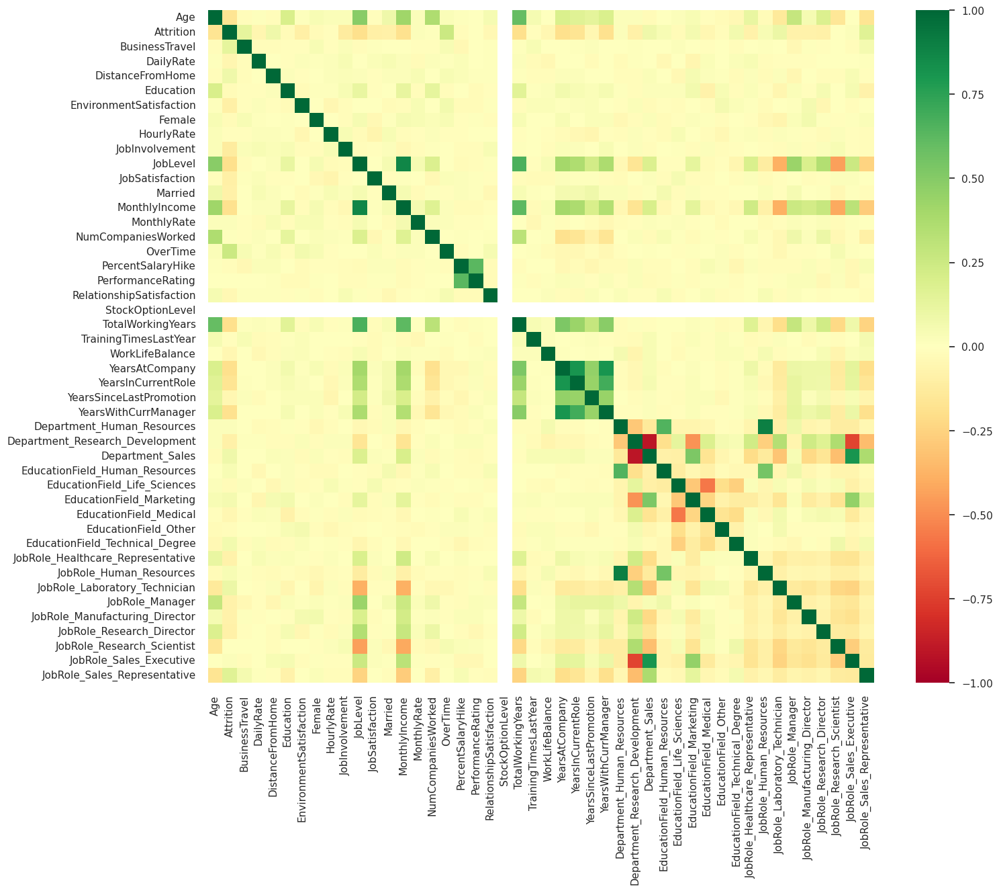

In [9]:
corr= df.corr(method='spearman').round(decimals=2)
display(corr)
plt.figure(figsize=(16,13))
ax=sns.heatmap(corr, xticklabels=True, yticklabels=True, cmap="RdYlGn", vmin=-1, vmax=1)

All in all, the relationships in the data are not quite surprising. E.g., higher age is associated with more working years, a higher job level, monthly income, and the number of companies worked at. The job level relates to monthly income, so do years at company, in current role, and with current manager. Concerning about the last three benchmarks is the positive relationship with years since last promotion, meaning that the longer employees work for the company, manager and role, they are less likely to be further promoted. This will be explored in detail in the later analysis. Multicollinearity will likely be a problem in this cluster and further examined.

Furthermore, a higher percent salary hike is associated with a better performance rating. 
When looking at departments and job roles, some jobs and educational careers naturally don't occur in certain departments (like Sales Executives and employees skilled in Marketing are seldom to be found in Research & Development) and are therefore negatively correlated, while other departments, professions and educations are positively related (like human resources employees in the human resources department).

Looking at Attrition, people working over time and as Sales Represantatives, who travel more, and have longer commuting distances seem to be more likely to leave, while job level, monthly income, stock option level, total working years , and years at the company, role, and with current manager are negatively correlated with attrition (i.e., less likely to leave). This will later be further examined.

First, the possible multicollinearity problem will be handled.

<AxesSubplot:>

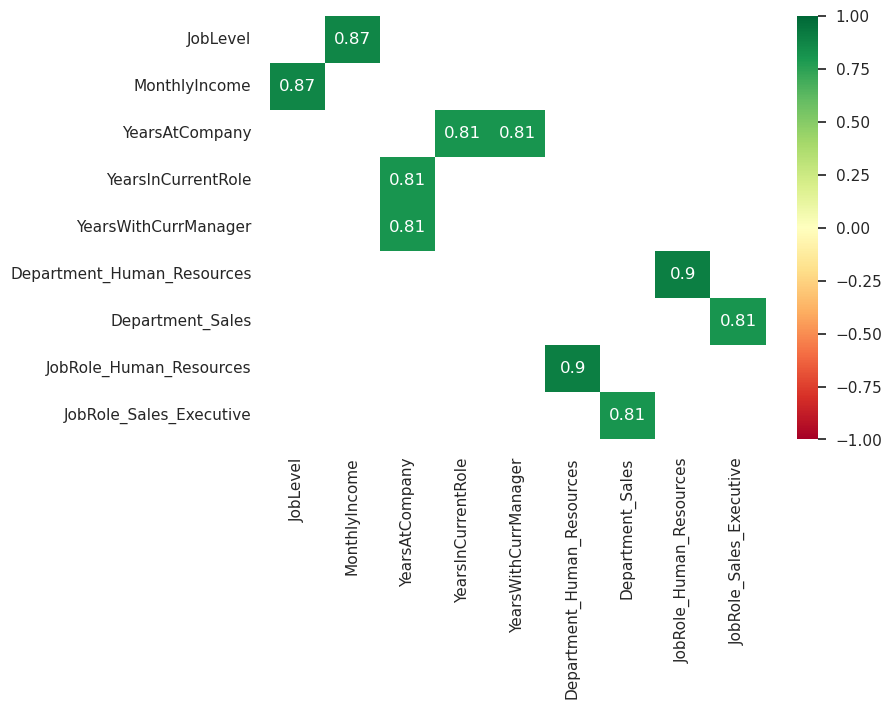

In [10]:
corr.replace({1:0}, inplace=True)
corr1=corr[corr>.7].dropna(how='all', axis=1)
corr2=corr1[corr1>.7].dropna(how='all', axis=0)
sns.heatmap(corr2, annot=True, xticklabels=True, yticklabels=True, cmap="RdYlGn", vmin=-1, vmax=1)

As interpretable features are needed for the upcoming analyses, a factor analysis will be performed to reduce dimensions and correlations in the data.

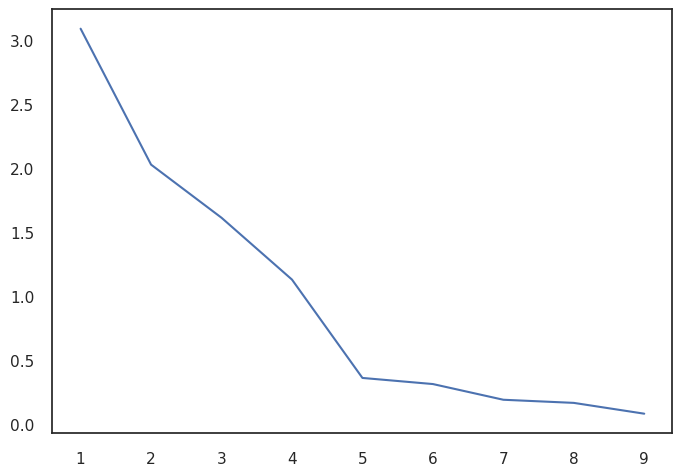

In [11]:
#Subset of the potentially problematic variables
df_fa =df[['JobLevel', 'MonthlyIncome', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsWithCurrManager',
            'Department_Human_Resources', 'Department_Sales', 'JobRole_Human_Resources', 'JobRole_Sales_Executive']]
fa = FactorAnalyzer()
fa.fit(df_fa, 10)
#Get Eigen values and plot them
ev, v = fa.get_eigenvalues()
ev
plt.plot(range(1,df_fa.shape[1]+1),ev)

As can be expected, the 4 factor solution is the most appropriate. The factor loadings will be inspected next. An oblimin rotation is chosen as the factors still are allowed to be correlated. This is important, because, e.g., job level and monthly income should still be allowed to covary with company/role/manager affiliation.

In [12]:
#Kaiser-Meyer-Olkin (KMO) Test
kmo_all,kmo_model=calculate_kmo(df_fa)
round(kmo_model,2)

0.61

Values less than .6 are considered inadequate for factor analysis. The data is just about suitable for factor analysis.

<AxesSubplot:ylabel='var'>

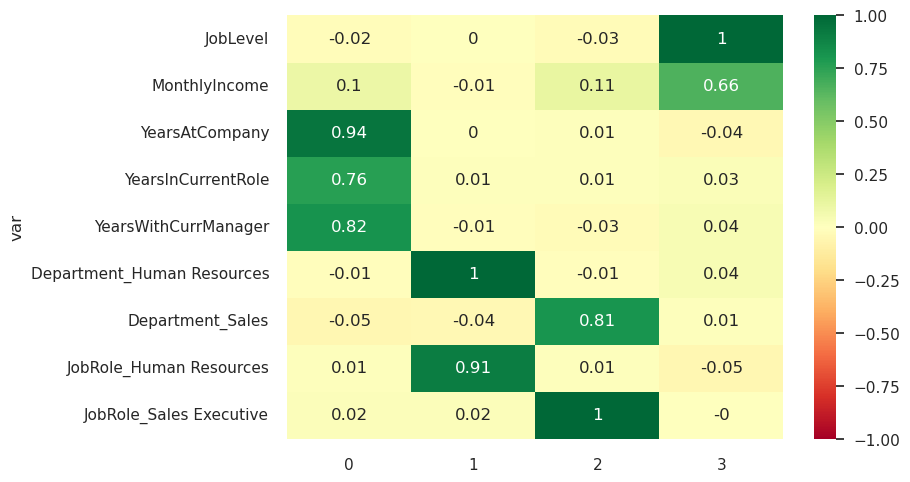

In [13]:
fa = FactorAnalyzer(4, rotation='oblimin')
fa.fit(df_fa)
df_loads = pd.DataFrame(np.around(fa.loadings_, 2))
df_loads['var']=['JobLevel', 'MonthlyIncome', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsWithCurrManager',
                 'Department_Human Resources', 'Department_Sales', 'JobRole_Human Resources', 'JobRole_Sales Executive']
df_loads.set_index('var', inplace=True)
sns.heatmap(df_loads, annot=True, xticklabels=True, yticklabels=True, cmap="RdYlGn", vmin=-1, vmax=1)

For the two item scales, the Spearman-Brown-coefficients reported in the correlation table above serve as measures of fit. All three are larger than .81 and therefore appropriate. The goodness of fit for the three item factor will be examined next. 

In [14]:
#Create the factor
factor1 = df[['YearsAtCompany', 'YearsInCurrentRole', 'YearsWithCurrManager']]

#Get cronbach alpha
factor1_alpha, loadings1 = pg.cronbach_alpha(factor1)

print(round(factor1_alpha, 2))

0.87


The cronbach alpha falls within the good cut-off (almost very good), the factor solution will therefore be implemented.
The following variables will be transformed to on factor each:
- **Years of Affiliation**: YearsAtCompany, YearsInCurrentRole, YearsWithCurrManager
- **Human Resources**: Department_Human Resources, JobRole_Human Resources
- **Sales**: Department_Sales, JobRole_Sales Executive
- **Job Standing**: JobLevel, MonthlyIncome

In [15]:
df[['YearsOfAffiliation', 'Human Resources', 'Sales', 'JobStanding']] = fa.fit_transform(df_fa)

In [16]:
df.head(2)

,Age,Attrition,BusinessTravel,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Female,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,Married,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Department_Human_Resources,Department_Research_Development,Department_Sales,EducationField_Human_Resources,EducationField_Life_Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical_Degree,JobRole_Healthcare_Representative,JobRole_Human_Resources,JobRole_Laboratory_Technician,JobRole_Manager,JobRole_Manufacturing_Director,JobRole_Research_Director,JobRole_Research_Scientist,JobRole_Sales_Executive,JobRole_Sales_Representative,YearsOfAffiliation,Human Resources,Sales,JobStanding
0,48,0,1,530,29,1,1,1,91,3,3,3,1,12504,23978,3,0,21,4,2,0,15,3,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,-1.372005,-0.171745,-0.629733,0.593878
1,45,0,2,364,25,3,2,1,83,3,5,2,0,6502,13035,3,0,22,4,3,0,22,4,3,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,-1.238696,-0.394255,-0.367450,2.675294


<h2>Explanatory analyses</h2>

<h3>Churn analysis</h3>
<h4>Logistic Regression</h4>
Next, employee churn will be examined. First, a logistic regression is implemented as a baseline model.

<AxesSubplot:xlabel='Attrition', ylabel='count'>

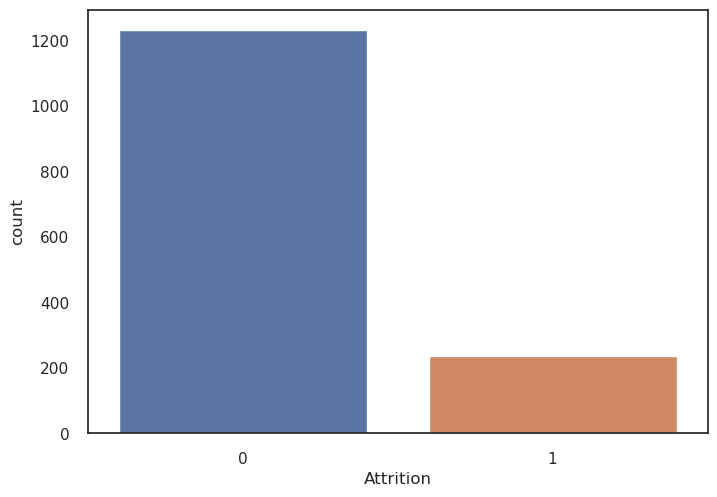

In [17]:
#Exploration of Attrition
df_lr=df
sns.countplot(x='Attrition', data=df_lr)

The classes are imbalanced, less employees leave than stay. Next, the importance of individual features will be explored. Data will therefore be standardized to enable comparison of features. See the table for mean differences between employees who left vs. those who stayed. The plot below indicates the importance of individual features. However, means are no longer interpretable in this plot due to standardization.

,Age,BusinessTravel,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Female,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,Married,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Department_Human_Resources,Department_Research_Development,Department_Sales,EducationField_Human_Resources,EducationField_Life_Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical_Degree,JobRole_Healthcare_Representative,JobRole_Human_Resources,JobRole_Laboratory_Technician,JobRole_Manager,JobRole_Manufacturing_Director,JobRole_Research_Director,JobRole_Research_Scientist,JobRole_Sales_Executive,JobRole_Sales_Representative,YearsOfAffiliation,Human Resources,Sales,JobStanding
Attrition,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,37.56,1.06,812.50,8.92,2.93,2.77,0.41,65.95,2.77,2.15,2.78,0.48,5674.89,14265.78,1.98,0.23,15.23,3.15,2.73,0.0,10.43,2.39,2.78,6.23,3.94,1.63,4.37,0.04,0.67,0.29,0.02,0.42,0.10,0.33,0.06,0.08,0.10,0.03,0.16,0.08,0.11,0.06,0.2,0.22,0.04,0.08,-0.01,-0.01,0.08
1,33.61,1.24,750.36,10.63,2.84,2.46,0.37,65.57,2.52,1.64,2.47,0.35,4513.64,14559.31,2.08,0.54,15.10,3.16,2.60,0.0,7.59,2.35,2.66,4.36,2.70,1.41,2.85,0.05,0.56,0.39,0.03,0.38,0.15,0.27,0.05,0.14,0.04,0.05,0.26,0.02,0.04,0.01,0.2,0.24,0.14,-0.40,0.05,0.05,-0.40


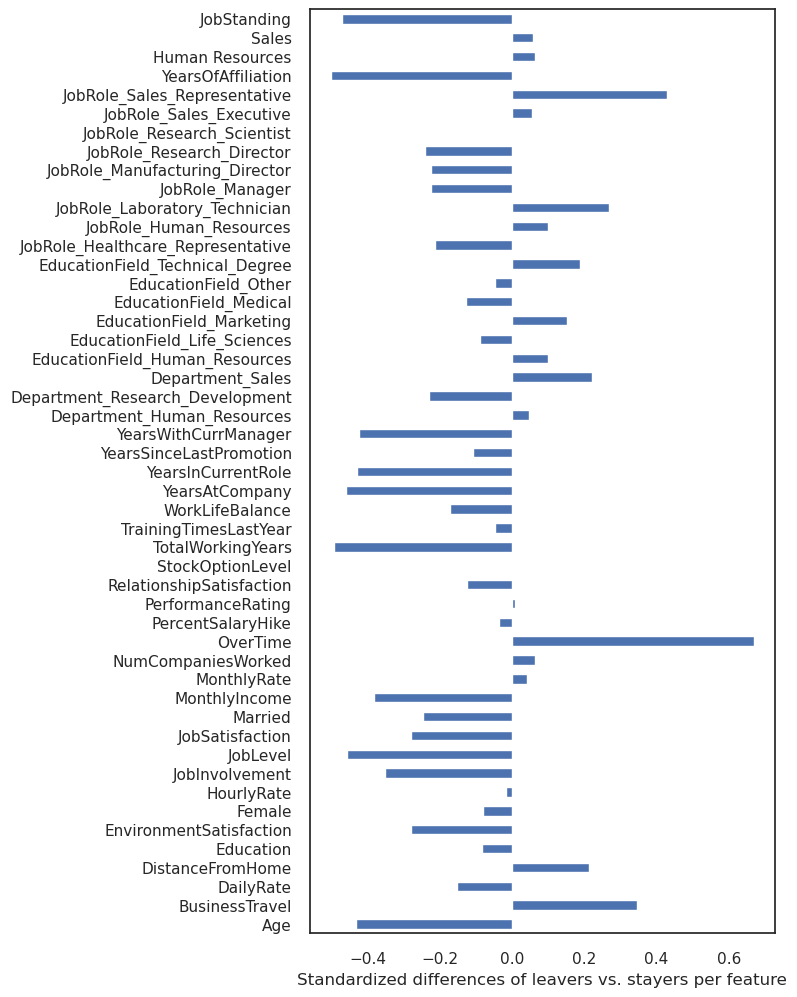

In [18]:
#Standardize data and calculate differences between employees who stayed vs. left
scaler= StandardScaler().fit(df_lr)
df_stand = pd.DataFrame(scaler.transform(df_lr))
df_stand.columns = df.columns
df_stand_attr=df_stand.groupby('Attrition').mean().transpose()
df_stand_attr.Diff=df_stand_attr.iloc[:,1] - df_stand_attr.iloc[:,0]

#generate table of unstandardized mean differences
display(round(df.groupby('Attrition').mean(),2))

#generate plot
fig=plt.figure()
fig.set_size_inches(6,12)
df_stand_attr.Diff.plot(kind='barh')
plt.xlabel('Standardized differences of leavers vs. stayers per feature')
plt.show()

As indicated by the correlation matrix, over time seems to be related with leaving, while, amongst others, job standing (the factor derived from job level and monthly income) seems to be correlated with staying.
Logistic regression is easily thrown off by multicollinearity, hence the data will be modeled using the factor solution applied above instead of raw features.

In [19]:
#generating data for logistic regression
df_lr.drop(columns=['JobLevel', 'MonthlyIncome', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsWithCurrManager',
                 'Department_Human_Resources', 'Department_Sales', 'JobRole_Human_Resources', 'JobRole_Sales_Executive'], 
           inplace=True)

The countplot at the top of this section shows very unbalanced classes. The churn class will therefore be upsampled using the SMOTE algorithm that randomly choses k nearest neighbors to create similar, but randomly tweaked observations. The data will first be divided into training and testing data, as only the training data will be upsampled. Also, all features will be standardized before applying SMOTE to ensure comparability of features.

In [20]:
#Train test split
X = df_lr.loc[:, df_lr.columns != 'Attrition']
y = df_lr.loc[:, df_lr.columns == 'Attrition']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

#Standardization
scaler=StandardScaler().fit(X_train)
X_train=scaler.transform(X_train)
X_test=scaler.transform(X_test)
columns = X.columns
X=scaler.transform(X)
X_lr = pd.DataFrame(data=X,columns=columns )

#SMOTE algorithm to balance churn cases
os = SMOTE(random_state=0)
os_X,os_y=os.fit_resample(X_train, y_train)
X_train = pd.DataFrame(data=os_X,columns=columns )
y_train = pd.DataFrame(data=os_y,columns=['Attrition'])

#Check the numbers of data
print("length of oversampled data is ",len(X_train))
print("Number of no attrition in oversampled data:",len(y_train[y_train['Attrition']==0]))
print("Number of attrition (unchanged):",len(y_train[y_train['Attrition']==1]))
print("Proportion of no attrition in oversampled data is ",len(y_train[y_train['Attrition']==0])/len(X_train))
print("Proportion of attrition in oversampled data is ",len(y_train[y_train['Attrition']==1])/len(X_train))

length of oversampled data is  1712
Number of no attrition in oversampled data: 856
Number of attrition (unchanged): 856
Proportion of no attrition in oversampled data is  0.5
Proportion of attrition in oversampled data is  0.5


Only churn cases were stocked up. Now, the data is perfectly balanced. To enable later comparison of features, data is, again, being standardized.

As logistic regression works under the assumption that only relevant features are kept in the model, recursive feature elemination (RFE) will be applied to incrementally exclude worst performing features from the model.

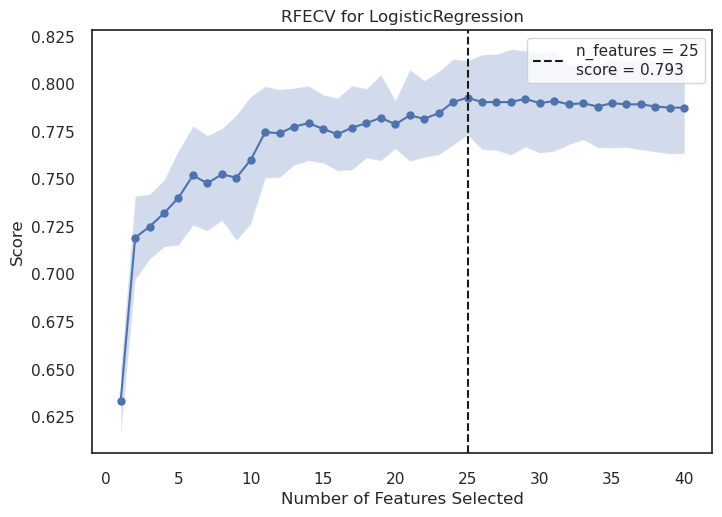

<AxesSubplot:title={'center':'RFECV for LogisticRegression'}, xlabel='Number of Features Selected', ylabel='Score'>

In [21]:
# Determine the optimal number of features by RFECV visualizer
logreg = LogisticRegression()
visualizer = RFECV(logreg)

visualizer.fit(X_train, y_train)
visualizer.show()

The best fitting model yields 25 (out of 40) features. The 6 features to be exluded will be determined next.

In [22]:
#Fit the RFE model with 25 features
rfe = RFE(logreg,
    n_features_to_select=25,
    step=1,)
rfe.fit(X_train, y_train.values.ravel())

#get names of excluded features
df_lr_vars=df_lr.columns.values.tolist()
X=[i for i in df_lr_vars if i not in y]
df_excluded=pd.DataFrame()
df_excluded['feature']=X
df_excluded['excl']=rfe.support_
X_included=df_excluded.loc[df_excluded['excl']==True, ['feature']]
X_final=pd.DataFrame(X_train, columns=columns)[X_included['feature'].to_list()]
X_test=pd.DataFrame(X_test, columns=columns)[X_included['feature'].to_list()]
X_lr=pd.DataFrame(X_lr, columns=columns)[X_included['feature'].to_list()]
y_final=y_train['Attrition']
df_excluded.loc[df_excluded['excl']==False, ['feature']]

,feature
6,Female
7,HourlyRate
11,MonthlyRate
14,PercentSalaryHike
15,PerformanceRating
17,StockOptionLevel
20,WorkLifeBalance
22,Department_Research_Development
24,EducationField_Life_Sciences
25,EducationField_Marketing


Now, the final model will be developed and implemented.

In [23]:
y_final = list(y_final)
logit_model=sm.Logit(y_final,X_final).fit()
result=logit_model
print(result.summary2())

Optimization terminated successfully.
         Current function value: 0.500722
         Iterations 6
                                 Results: Logit
Model:                   Logit                 Pseudo R-squared:      0.278      
Dependent Variable:      y                     AIC:                   1764.4712  
Date:                    2023-01-05 15:34      BIC:                   1900.6066  
No. Observations:        1712                  Log-Likelihood:        -857.24    
Df Model:                24                    LL-Null:               -1186.7    
Df Residuals:            1687                  LLR p-value:           1.0922e-123
Converged:               1.0000                Scale:                 1.0000     
No. Iterations:          6.0000                                                  
---------------------------------------------------------------------------------
                                   Coef.  Std.Err.    z    P>|z|   [0.025  0.975]
------------------------------

Some features lack significance and will therefore be trimmed from the final model.


Optimization terminated successfully.
         Current function value: 0.503325
         Iterations 6
                                 Results: Logit
Model:                   Logit                 Pseudo R-squared:      0.274      
Dependent Variable:      y                     AIC:                   1767.3836  
Date:                    2023-01-05 15:34      BIC:                   1887.1828  
No. Observations:        1712                  Log-Likelihood:        -861.69    
Df Model:                21                    LL-Null:               -1186.7    
Df Residuals:            1690                  LLR p-value:           4.8501e-124
Converged:               1.0000                Scale:                 1.0000     
No. Iterations:          6.0000                                                  
---------------------------------------------------------------------------------
                                   Coef.  Std.Err.    z    P>|z|   [0.025  0.975]
------------------------------

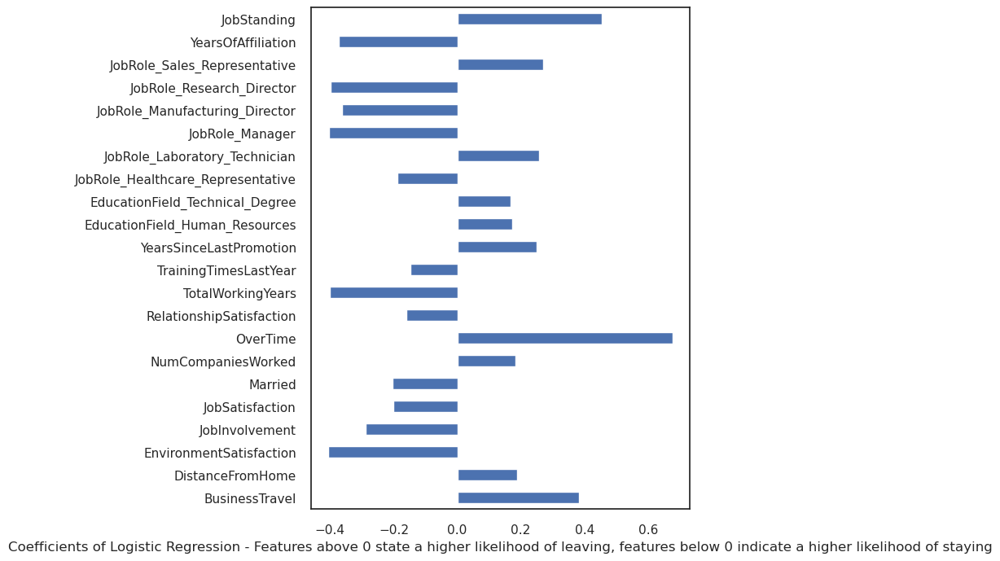

In [24]:
#excluding features from training and testing data
p_lr=pd.DataFrame(result.summary2().tables[1]['P>|z|'])
cols=p_lr[p_lr['P>|z|']<.05].index.tolist()

X_final=X_final[cols]
X_test=X_test[cols]
X_lr=X_lr[cols]

#performing lr
logit_model=sm.Logit(y_final, X_final)
result=logit_model.fit()
print(result.summary2())

#visualization of coefficients
fig=plt.figure()
fig.set_size_inches(6,8)
coef_lr=result.summary2().tables[1]['Coef.'].squeeze()
coef_lr.plot(kind='barh')
plt.xlabel('Coefficients of Logistic Regression - Features above 0 state a higher likelihood of leaving, features below 0 indicate a higher likelihood of staying')
plt.show()

The final model will now be fitted and assessed considering accuracy and precision.

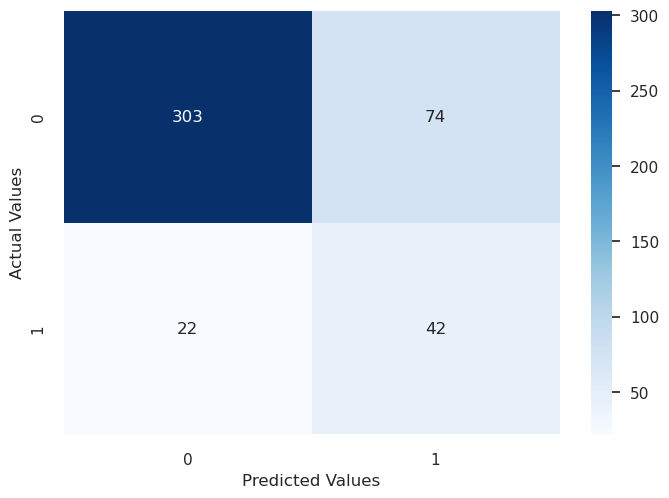

              precision    recall  f1-score   support

           0       0.93      0.80      0.86       377
           1       0.36      0.66      0.47        64

    accuracy                           0.78       441
   macro avg       0.65      0.73      0.66       441
weighted avg       0.85      0.78      0.81       441

lr accurcy on training data: 0.7949766355140186
lr accurcy on test data: 0.782312925170068


In [25]:
#Fitting the model
logreg.fit(X_final, y_final)
y_pred=logreg.predict(X_test)

#Confusion matrix and precision, recall, f1, support, and accuracy
cm_lr = confusion_matrix(y_test, y_pred)
sns.heatmap(cm_lr, annot=True, fmt='g', cmap='Blues')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.show()
cr_lr = classification_report(y_test, y_pred)
acc_train_lr = logreg.score(X_final, y_final)
acc_test_lr = logreg.score(X_test, y_test)
print(cr_lr)
print('lr accurcy on training data:', acc_train_lr)
print('lr accurcy on test data:', acc_test_lr)

The final model performs quite well on the training data and does not seem to overfit.

<h4>K-Nearest Neighbor</h4>
In the following section, the knn algorithm will be run with the same data to cross-validate the logistic regression model.
As features are not modelled seperately in this approach, multicollinearity is no issue in this model. Therefore, the raw features without the factor solution will be assessed. Once again, SMOTE and standarization will be used.

In [26]:
#importing data from BigQuery
query = """SELECT * FROM `superstore-367609.churn.formatted`"""
job = client.query(query)
df_knn = job.to_dataframe()

In [27]:
#Train test split
X = df_knn.loc[:, df_knn.columns != 'Attrition']
y = df_knn.loc[:, df_knn.columns == 'Attrition']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

#Standardization
scaler=StandardScaler().fit(X_train)
X_train=scaler.transform(X_train)
X_test=scaler.transform(X_test)
columns = X.columns
X=scaler.transform(X)
X = pd.DataFrame(data=X,columns=columns )

#SMOTE algorithm to balance churn cases
os = SMOTE(random_state=0)
os_X,os_y=os.fit_resample(X_train, y_train['Attrition'].to_list())
X_train = pd.DataFrame(data=os_X,columns=columns )
y_train = pd.DataFrame(data=os_y,columns=['Attrition'])

#Check the numbers of data
print("length of oversampled data is ",len(X_train))
print("Number of no attrition in oversampled data:",len(y_train[y_train['Attrition']==0]))
print("Number of attrition (unchanged):",len(y_train[y_train['Attrition']==1]))
print("Proportion of no attrition in oversampled data is ",len(y_train[y_train['Attrition']==0])/len(X_train))
print("Proportion of attrition in oversampled data is ",len(y_train[y_train['Attrition']==1])/len(X_train))

length of oversampled data is  1738
Number of no attrition in oversampled data: 869
Number of attrition (unchanged): 869
Proportion of no attrition in oversampled data is  0.5
Proportion of attrition in oversampled data is  0.5


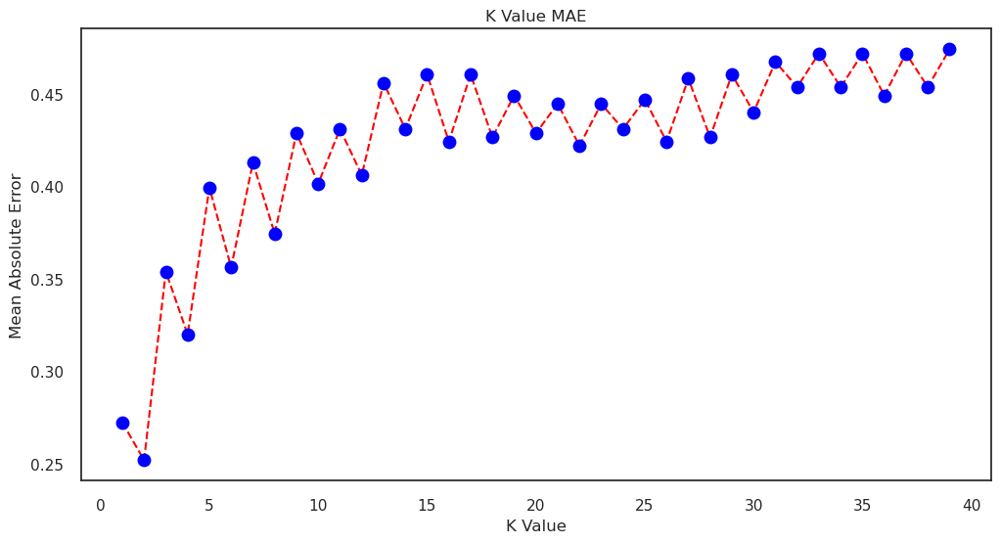

Optimal k is 2


In [28]:
#Grid search to determine optimal number of k
error = []

# Calculating MAE error for K values between 1 and 39
for i in range(1, 40):
    knn = neighbors.KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    pred_i = knn.predict(X_test)
    mae = mean_absolute_error(y_test, pred_i)
    error.append(mae)
    
plt.figure(figsize=(12, 6))
plt.plot(range(1, 40), error, color='red', 
         linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=10)
         
plt.title('K Value MAE')
plt.xlabel('K Value')
plt.ylabel('Mean Absolute Error')
plt.show()

params = {'n_neighbors': np.arange(1,10),
         'metric': ['euclidian', 'cityblock']}
grid = GridSearchCV(estimator=knn, param_grid=params)
grid.fit(X_train, y_train)
print('Optimal k is', grid.best_estimator_.n_neighbors)

Both, plot and grid search result in k=2 as the optimal solution. The model will be fitted next.

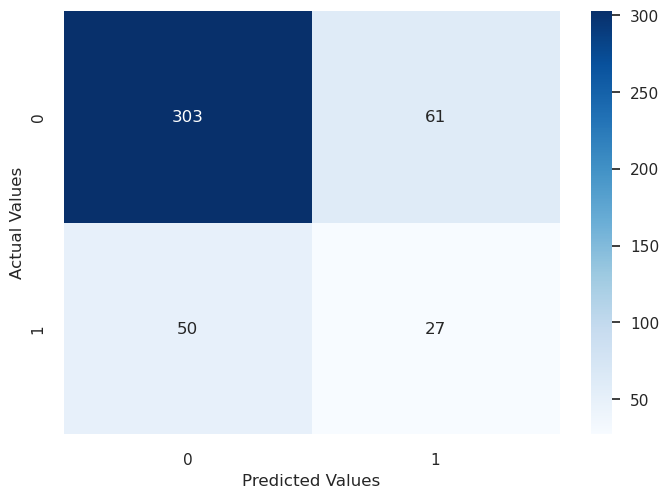

              precision    recall  f1-score   support

           0       0.86      0.83      0.85       364
           1       0.31      0.35      0.33        77

    accuracy                           0.75       441
   macro avg       0.58      0.59      0.59       441
weighted avg       0.76      0.75      0.75       441

knn accurcy on training data: 0.9994246260069045
knn accurcy on test data: 0.7482993197278912


In [29]:
#Implementing the model
knn = neighbors.KNeighborsClassifier(n_neighbors=2)
knn.fit(X_train, y_train)

#Validation of the model
y_pred=knn.predict(X_test)

#Confusion matrix and precision, recall, f1, support, and accuracy
cm_knn = confusion_matrix(y_test['Attrition'].to_list(), y_pred.tolist())
sns.heatmap(cm_knn, annot=True, fmt='g', cmap='Blues')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.show()
cr_knn = classification_report(y_test['Attrition'].to_list(), y_pred.tolist())
acc_train_knn = knn.score(X_train, y_train)
acc_test_knn = knn.score(X_test, y_test['Attrition'].to_list())
print(cr_knn)
print('knn accurcy on training data:', acc_train_knn)
print('knn accurcy on test data:', acc_test_knn)

The KNN model fits the data better than the logistic regression model. Now, random forest classification will be set up.

<h3>Random forest</h3>
The random forest algorithm handles non-linear relationships, interactions, outliers, and high correlations in raw data well. Therefore, the non-factorized solution will be implemented. 

In [30]:
#importing data from BigQuery
query = """SELECT * FROM `superstore-367609.churn.formatted`"""
job = client.query(query)
df_rf = job.to_dataframe()

In [31]:
#Train test split
X = df_rf.loc[:, df_rf.columns != 'Attrition']
y = df_rf.loc[:, df_rf.columns == 'Attrition']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

#Standardization
scaler=StandardScaler().fit(X_train)
X_train=scaler.transform(X_train)
X_test=scaler.transform(X_test)
columns = X.columns
X=scaler.transform(X)
X_rf = pd.DataFrame(data=X,columns=columns )

#SMOTE algorithm to balance churn cases
os = SMOTE(random_state=0)
os_X,os_y=os.fit_resample(X_train, y_train['Attrition'].to_list())
X_train = pd.DataFrame(data=os_X,columns=columns )
y_train = pd.DataFrame(data=os_y,columns=['Attrition'])

#Check the numbers of data
print("length of oversampled data is ",len(X_train))
print("Number of no attrition in oversampled data:",len(y_train[y_train['Attrition']==0]))
print("Number of attrition (unchanged):",len(y_train[y_train['Attrition']==1]))
print("Proportion of no attrition in oversampled data is ",len(y_train[y_train['Attrition']==0])/len(X_train))
print("Proportion of attrition in oversampled data is ",len(y_train[y_train['Attrition']==1])/len(X_train))

length of oversampled data is  1738
Number of no attrition in oversampled data: 869
Number of attrition (unchanged): 869
Proportion of no attrition in oversampled data is  0.5
Proportion of attrition in oversampled data is  0.5


The random forest algorithm is quite robust to hyperparameter tuning, however, overfitting can be reduced. Therefore, appropriate hyperparameters are identified by a grid search before setting up the final model.

In [32]:
#Hyperparameter tuning

# Number of trees in random forest
n_estimators = np.linspace(100, 3000, int((3000-100)/200) + 1, dtype=int)
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [10, 20, 50, 75, 100, 150, 200, 300, 400, 500]
# Minimum number of samples required to split a node
min_samples_split = [1, 2, 5, 10, 15]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 3, 4, 5, 6]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Criterion
criterion=['gini', 'entropy']

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap,
               'criterion': criterion}

rf_base = RandomForestClassifier()
rf_random = RandomizedSearchCV(estimator = rf_base,
                               param_distributions = random_grid,
                               n_iter = 30, cv = 5,
                               verbose=0,
                               random_state=0, n_jobs = -1)
rf_random.fit(X_train, y_train.values.ravel())

rf_random.best_params_

{'n_estimators': 721,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'sqrt',
 'max_depth': 75,
 'criterion': 'gini',
 'bootstrap': False}

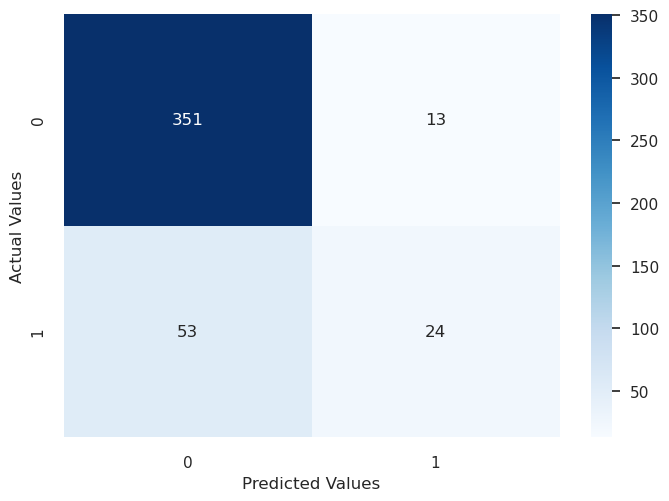

              precision    recall  f1-score   support

           0       0.87      0.96      0.91       364
           1       0.65      0.31      0.42        77

    accuracy                           0.85       441
   macro avg       0.76      0.64      0.67       441
weighted avg       0.83      0.85      0.83       441

rf accurcy on training data: 1.0
rf accurcy on test data: 0.8503401360544217


In [33]:
#Building the model according to grid search hyperparameters
rf = RandomForestClassifier(n_estimators= 721, min_samples_split= 2,
                            min_samples_leaf= 2, max_features= 'sqrt',
                            max_depth= 75, criterion= 'gini', bootstrap= False)
rf.fit(X_train, y_train.values.ravel())

#Validation of the model
y_pred=rf.predict(X_test)

#Confusion matrix and precision, recall, f1, support, and accuracy
cm_rf = confusion_matrix(y_test['Attrition'].to_list(), y_pred.tolist())
sns.heatmap(cm_rf, annot=True, fmt='g', cmap='Blues')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.show()
cr_rf = classification_report(y_test['Attrition'].to_list(), y_pred.tolist())
acc_train_rf = rf.score(X_train, y_train)
acc_test_rf = rf.score(X_test, y_test['Attrition'].to_list())
print(cr_rf)
print('rf accurcy on training data:', acc_train_rf)
print('rf accurcy on test data:', acc_test_rf)

The random forest model also scores quite well. The importance of different features in this approach is plotted next.

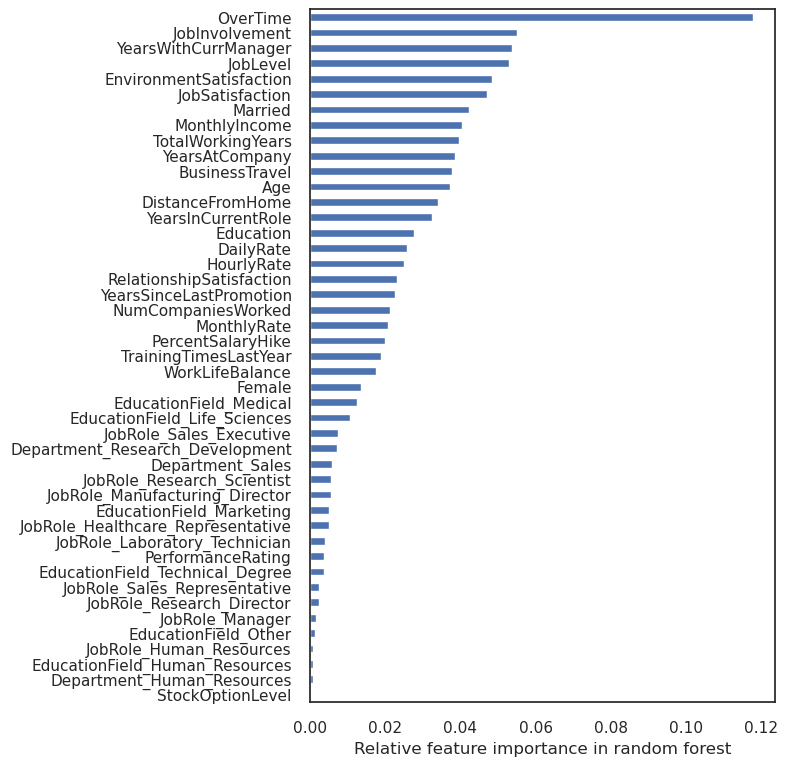

In [34]:
coef_rf=pd.DataFrame(rf.feature_importances_, index=X_rf.columns).sort_values(by=0, ascending=True)
coef_rf = coef_rf.squeeze()

#visualization of coefficients
fig=plt.figure()
fig.set_size_inches(6,9)
coef_rf.plot(kind='barh')
plt.xlabel('Relative feature importance in random forest')
plt.show()

Monthly income, followed by job involvement, and job satisfaction are the most important features in the random forest model. Note, however, that the importance does not state whether the features positively or negatively contribute to churn.

<h3>Model comparison</h3>

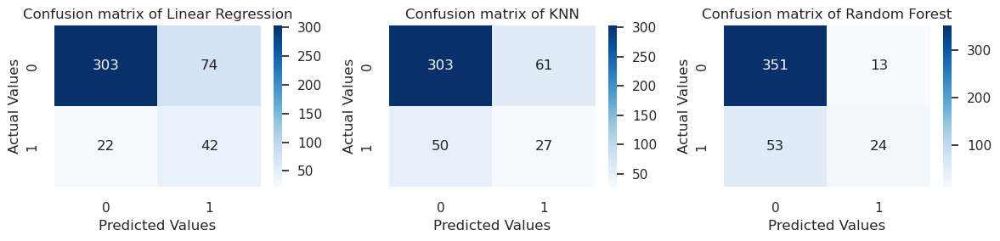

Classification report of LOGISTIC REGRESSION:
              precision    recall  f1-score   support

           0       0.93      0.80      0.86       377
           1       0.36      0.66      0.47        64

    accuracy                           0.78       441
   macro avg       0.65      0.73      0.66       441
weighted avg       0.85      0.78      0.81       441

Classification report of KNN:
              precision    recall  f1-score   support

           0       0.86      0.83      0.85       364
           1       0.31      0.35      0.33        77

    accuracy                           0.75       441
   macro avg       0.58      0.59      0.59       441
weighted avg       0.76      0.75      0.75       441

Classification report of RANDOM FOREST:
              precision    recall  f1-score   support

           0       0.87      0.96      0.91       364
           1       0.65      0.31      0.42        77

    accuracy                           0.85       441
   macro avg

In [35]:
fig = plt.figure()
fig.set_size_inches(12,3)
ax0 = fig.add_subplot(131)
sns.heatmap(cm_lr, annot=True, fmt='g', cmap='Blues', ax=ax0)
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.title('Confusion matrix of Linear Regression')
ax1 = fig.add_subplot(132)
sns.heatmap(cm_knn, annot=True, fmt='g', cmap='Blues', ax=ax1)
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.title('Confusion matrix of KNN')
ax2 = fig.add_subplot(133)
sns.heatmap(cm_rf, annot=True, fmt='g', cmap='Blues', ax=ax2)
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.title('Confusion matrix of Random Forest')
fig.tight_layout()
plt.show()

print('Classification report of LOGISTIC REGRESSION:')
print(cr_lr)
print('Classification report of KNN:')
print(cr_knn)
print('Classification report of RANDOM FOREST:')
print(cr_rf)
print('Accuracy of training data in LR:', round(acc_train_lr, 2), ', in KNN:', round(acc_train_knn ,2), ', and in RF:', round(acc_train_rf ,2))
print('Accuracy of testing data in LR:', round(acc_test_lr, 2), ', in KNN:', round(acc_test_knn ,2), ', and in RF:', round(acc_test_rf ,2))

All models perform quite well, however, the 1.0 accuracy of KNN and RF in the training data hints on overfitting models.
As employees most likely to churn (not most likely to stay) are to be identified, focus of model comparison will be on the Attrition=1 class.
Summing up, the model comparison states that:
- **Precision** (% of correct predictions) is best in **RF**
- **Recall** (% of positive cases the model caught) is best in **LR**
- **F1** (% of positive predictions that were correst) is best in **LR**

The KNN model performs worst, random forest and logistic regression will both be used in the following analysis to even out each other's weaknesses.
Next, important reasouns for churn and employees who are most likely to churn due to their characteristics will be identified .

<h3>Inference statistic</h3>

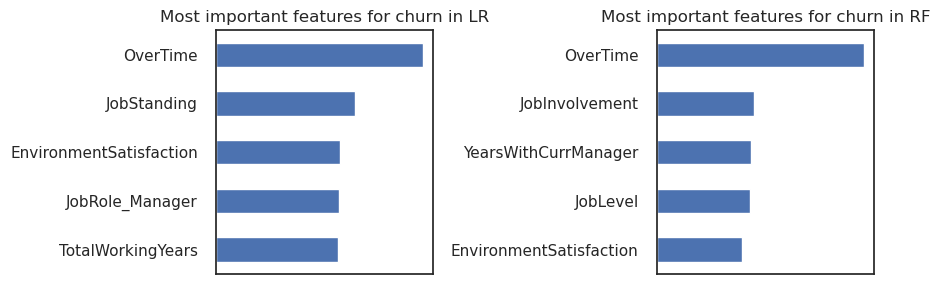

In [36]:
#Prepare coefficients
measures_rf=pd.DataFrame(coef_rf).tail(5)
coef_lr = pd.DataFrame(coef_lr)
coef_lr['Coef.'] = coef_lr['Coef.'].abs()
measures_lr=coef_lr.sort_values(by='Coef.', ascending=True).tail(5)

#Generate plot
fig=plt.figure()
fig.set_size_inches(9,3)
ax0=fig.add_subplot(121)
measures_lr.plot(kind='barh', ax=ax0)
ax0.get_legend().remove()
plt.title('Most important features for churn in LR')
plt.xticks([])
ax1=fig.add_subplot(122)
measures_rf.plot(kind='barh', ax=ax1)
plt.title('Most important features for churn in RF')
ax1.get_legend().remove()
plt.xticks([])
fig.tight_layout()
plt.show()

Both, LR and RF identify **over time** as the most prominent reason for employee churn. Also, both models include time variables like job standing (factor from factor analysis) and years with current manager as important features. However, these are impossible to manipulate and therefore unsuitable for deriving measures from.
The second external factor appearing in both models is **environment satisfaction**.
Employees most likely to churn should therefore have overtime reduced and their environment upgraded, either by asking them specifically about their needs, or by identifying potential improvements in a workplace analysis.

Employees most likely to churn will now be identified by cross-validating the LR and RF model.

In [37]:
#Predicting churn with logistic regression
lr_y_pred=logreg.predict(X_lr)
X_lr['PredAttrition']=lr_y_pred
X_lr['Attrition']=df_full['Attrition']
X_lr['EmployeeNumber']=df_full['EmployeeNumber']
X_lr['AttritionLikely']=X_lr['PredAttrition']-X_lr['Attrition']
LikelyToChurn_lr=pd.DataFrame(X_lr['EmployeeNumber'][X_lr['AttritionLikely']==1])
display(LikelyToChurn_lr.info())

#Predicting churn with random forest
rf_y_pred=rf.predict(X_rf)
X_rf['PredAttrition']=rf_y_pred
X_rf['Attrition']=df_full['Attrition']
X_rf['EmployeeNumber']=df_full['EmployeeNumber']
X_rf['AttritionLikely']=X_rf['PredAttrition']-X_rf['Attrition']
LikelyToChurn_rf=pd.DataFrame(X_rf['EmployeeNumber'][X_rf['AttritionLikely']==1])
display(LikelyToChurn_rf.info())

#Identifying employees that will churn according to both models
Employees_churn = set(LikelyToChurn_lr['EmployeeNumber'].to_list()).intersection(LikelyToChurn_rf['EmployeeNumber'].to_list())
print(len(Employees_churn), "are very likely to churn. These are:")
display(df_full[df_full['EmployeeNumber'].isin(Employees_churn)])

<class 'pandas.core.frame.DataFrame'>
Int64Index: 271 entries, 32 to 1467
Data columns (total 1 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   EmployeeNumber  271 non-null    Int64
dtypes: Int64(1)
memory usage: 4.5 KB


None

<class 'pandas.core.frame.DataFrame'>
Int64Index: 168 entries, 22 to 1445
Data columns (total 1 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   EmployeeNumber  168 non-null    Int64
dtypes: Int64(1)
memory usage: 2.8 KB


None

37 are very likely to churn. These are:


,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Female,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,Married,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
32,46,0,1,488,Sales,2,3,Technical Degree,1,363,3,1,75,1,4,Manager,2,1,6502,14977,3,1,12,3,2,80,0,11,2,2,7,7,7,7
111,44,0,1,528,Human Resources,1,3,Life Sciences,1,1683,3,1,44,3,1,Human Resources,4,0,3195,4167,4,1,18,3,1,80,0,8,2,3,2,2,2,2
112,24,0,2,897,Human Resources,10,3,Medical,1,1746,1,0,59,3,1,Human Resources,4,1,2145,2097,0,0,14,3,4,80,0,3,2,3,2,2,2,1
188,53,0,1,868,Sales,8,3,Marketing,1,897,1,0,73,3,4,Sales Executive,4,1,11836,22789,5,0,14,3,3,80,0,11,3,3,2,0,2,2
192,33,0,1,1242,Sales,8,4,Life Sciences,1,1560,1,0,46,3,2,Sales Executive,1,1,6392,10589,2,0,13,3,4,80,0,8,2,1,2,2,2,2
194,41,0,1,1206,Sales,23,2,Life Sciences,1,1678,4,0,80,3,3,Sales Executive,3,0,7082,11591,3,1,16,3,4,80,0,21,2,3,2,0,0,2
219,31,0,2,1125,Sales,7,4,Marketing,1,1833,1,1,68,3,3,Sales Executive,1,1,9637,8277,2,0,14,3,4,80,0,9,3,3,3,2,2,2
220,39,0,0,1251,Sales,21,4,Life Sciences,1,1929,1,1,32,1,2,Sales Executive,3,1,5736,3987,6,0,19,3,3,80,0,10,1,3,3,2,1,2
246,45,0,1,1268,Sales,4,2,Life Sciences,1,240,3,1,30,3,2,Sales Executive,1,0,5006,6319,4,1,11,3,1,80,0,9,3,4,5,4,0,3
274,36,0,1,1174,Sales,3,4,Marketing,1,1425,1,1,99,3,2,Sales Executive,2,0,9278,20763,3,1,16,3,4,80,0,15,3,3,5,4,0,1


<h2>Summary</h2>

The analyses show a fairly consistent picture: apparently, overtime and a lack of environment satisfaction are the main reasons in the company why employees leave.
Three different machine learning algorithms were trained and implemented, two of them were used to identify employees who are at risk of churn. Especially for these individuals, measures should be implemented quickly to prevent churn.